In [3]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from catboost import CatBoostClassifier
from imblearn.over_sampling import RandomOverSampler
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

path = r"C:\Users\karth\Downloads\disease_associations (1).xls"
data = pd.read_excel(path)

print(data.isnull().sum())

constant_value = 'Unknown'
data['diseaseClass'].fillna(constant_value, inplace=True)
print(data.describe())
print(data.isnull().sum())

label_encoder = LabelEncoder()
for column in data.select_dtypes(include=['object']).columns:
    data[column] = label_encoder.fit_transform(data[column])
print(data.describe())

print(data.head())

diseaseId                  0
diseaseName                0
diseaseType                0
diseaseClass           11523
diseaseSemanticType        0
NofGenes                   0
NofPmids                   0
dtype: int64
           NofGenes       NofPmids
count  30170.000000   30170.000000
mean      37.618230      62.971263
std      212.718751     938.918271
min        1.000000       0.000000
25%        1.000000       1.000000
50%        3.000000       2.000000
75%       14.000000      11.000000
max    10161.000000  104011.000000
diseaseId              0
diseaseName            0
diseaseType            0
diseaseClass           0
diseaseSemanticType    0
NofGenes               0
NofPmids               0
dtype: int64
          diseaseId   diseaseName   diseaseType  diseaseClass  \
count  30170.000000  30170.000000  30170.000000  30170.000000   
mean   15084.500000  15084.500000      0.524727    672.680013   
std     8709.473147   8709.473147      0.861599    410.767425   
min        0.000000  

In [12]:
r={}

diseaseId                  0
diseaseName                0
diseaseType                0
diseaseClass           11523
diseaseSemanticType        0
NofGenes                   0
NofPmids                   0
dtype: int64
diseaseId              0
diseaseName            0
diseaseType            0
diseaseClass           0
diseaseSemanticType    0
NofGenes               0
NofPmids               0
dtype: int64
   diseaseId  diseaseName  diseaseType  diseaseClass  diseaseSemanticType  \
0          0          531            2           654                   30   
1          1          534            2           284                   30   
2          2          530            2           143                   15   
3          3          546            2           143                   15   
4          4          538            1            49                   23   

   NofGenes  NofPmids  
0         2         2  
1         1         1  
2       103         0  
3         2         0  
4        13  

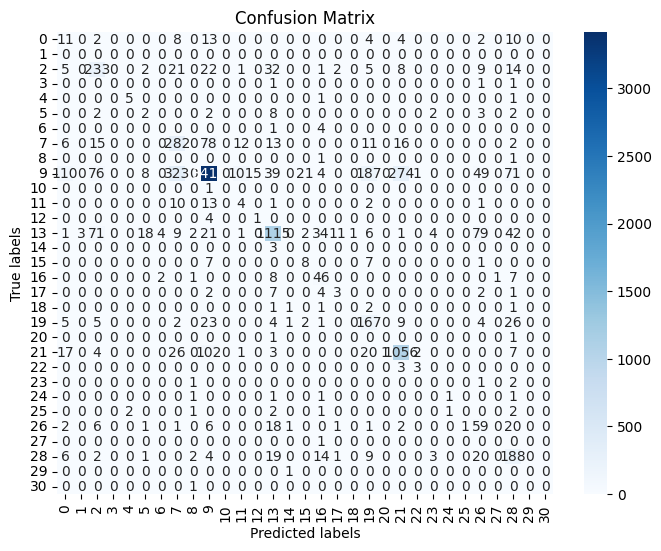

In [13]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from catboost import CatBoostClassifier
from imblearn.over_sampling import RandomOverSampler
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

path = r"C:\Users\karth\Downloads\disease_associations (1).xls"
data = pd.read_excel(path)

print(data.isnull().sum())

constant_value = 'Unknown'
data['diseaseClass'].fillna(constant_value, inplace=True)

print(data.isnull().sum())

label_encoder = LabelEncoder()
for column in data.select_dtypes(include=['object']).columns:
    data[column] = label_encoder.fit_transform(data[column])

print(data.head())

# data=data.head(1000)

X = data.drop('diseaseSemanticType', axis=1)
y = data['diseaseSemanticType']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

ros = RandomOverSampler(random_state=42)
X_train_resampled, y_train_resampled = ros.fit_resample(X_train, y_train)

print("Class distribution after over sampling:")
print(pd.Series(y_train_resampled).value_counts())

catboost_model = CatBoostClassifier(iterations=1000, learning_rate=0.1, depth=6, verbose=0)
catboost_model.fit(X_train_resampled, y_train_resampled)

y_pred = catboost_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print('CatBoostClassifier:')
print("Accuracy:", accuracy)
r['CBC']=accuracy
print("\nClassification Report:")
print(classification_report(y_test, y_pred, zero_division=1))

conf_mat = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()


In [14]:
from sklearn.metrics import roc_curve, auc

# Compute ROC curve
y_pred_proba = catboost_model.predict_proba(X_test)
fpr, tpr, _ = roc_curve(y_test, y_pred_proba[:, 1])
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 8))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - CatBoostClassifier')
# plt.legend(loc='lower right')
plt.grid(True)
plt.show()


ValueError: multiclass format is not supported

In [3]:
models = {
    "ExtraTreesClassifier": '',
    "LGBMClassifier": '',
    "RandomForestClassifier": '',
    "XGBoost": ''
}


In [3]:
random_sample = data.sample(n=1508)  
X_test = random_sample
predictions = catboost_model.predict(X_test)
random_sample['Predicted'] = predictions
print(random_sample)

actual_labels = random_sample['diseaseSemanticType']
predicted_labels = random_sample['Predicted']
accuracy = accuracy_score(actual_labels, predicted_labels)
print("Accuracy for the 20 random samples: {:.2f}%".format(accuracy * 100))


       diseaseId  diseaseName  diseaseType  diseaseClass  diseaseSemanticType  \
4872        4872         7978            2          1106                   30   
4452        4452        17045            1            49                   23   
14414      14414        24219            0          1106                   11   
17379      17379        19137            0           284                   11   
9805        9805        25968            0           557                   11   
...          ...          ...          ...           ...                  ...   
15576      15576         3853            2          1106                   15   
24648      24648        12663            0          1106                   15   
8426        8426        13581            0             0                   11   
13563      13563        10826            0            49                   23   
14924      14924        25496            0            71                   23   

       NofGenes  NofPmids  

diseaseId                  0
diseaseName                0
diseaseType                0
diseaseClass           11523
diseaseSemanticType        0
NofGenes                   0
NofPmids                   0
dtype: int64
diseaseId              0
diseaseName            0
diseaseType            0
diseaseClass           0
diseaseSemanticType    0
NofGenes               0
NofPmids               0
dtype: int64
   diseaseId  diseaseName  diseaseType  diseaseClass  diseaseSemanticType  \
0          0          531            2           654                   30   
1          1          534            2           284                   30   
2          2          530            2           143                   15   
3          3          546            2           143                   15   
4          4          538            1            49                   23   

   NofGenes  NofPmids  
0         2         2  
1         1         1  
2       103         0  
3         2         0  
4        13  

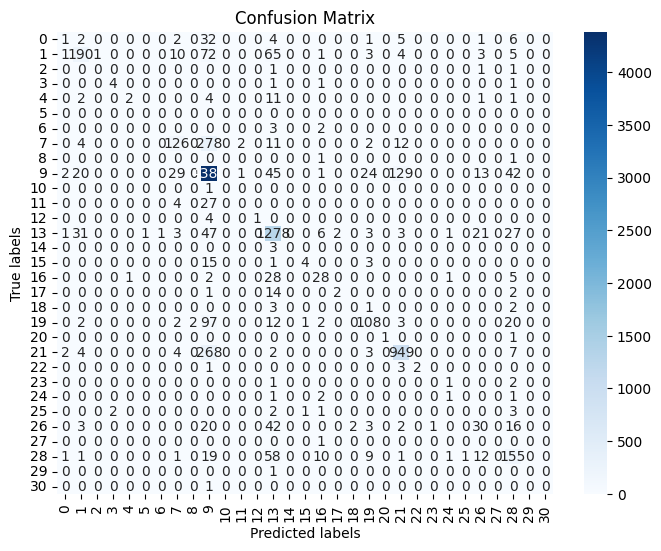

In [4]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.ensemble import ExtraTreesClassifier
from imblearn.over_sampling import RandomOverSampler
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

path = r"C:\Users\karth\Downloads\disease_associations (1).xls"
data = pd.read_excel(path)

print(data.isnull().sum())

constant_value = 'Unknown'
data['diseaseClass'].fillna(constant_value, inplace=True)

print(data.isnull().sum())

label_encoder = LabelEncoder()
for column in data.select_dtypes(include=['object']).columns:
    data[column] = label_encoder.fit_transform(data[column])

print(data.head())

# data=data.head(1000)

X = data.drop('diseaseSemanticType', axis=1)
y = data['diseaseSemanticType']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

ros = RandomOverSampler(random_state=42)
X_train_resampled, y_train_resampled = ros.fit_resample(X_train, y_train)

print("Class distribution after over sampling:")
print(pd.Series(y_train_resampled).value_counts())


et_model = ExtraTreesClassifier(n_estimators=100, random_state=42)
et_model.fit(X_train_resampled, y_train_resampled)

y_pred = et_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print('ExtraTreesClassifier:')
print("Accuracy:", accuracy)
# r['ET']=accuracy

class_report = classification_report(y_test, y_pred,zero_division=1)
print("\nClassification Report:")
print(class_report)

conf_mat = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()



In [5]:
models

{'ExtraTreesClassifier': '',
 'LGBMClassifier': '',
 'RandomForestClassifier': '',
 'XGBoost': ''}

In [6]:
models['ExtraTreesClassifier']=et_model

C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


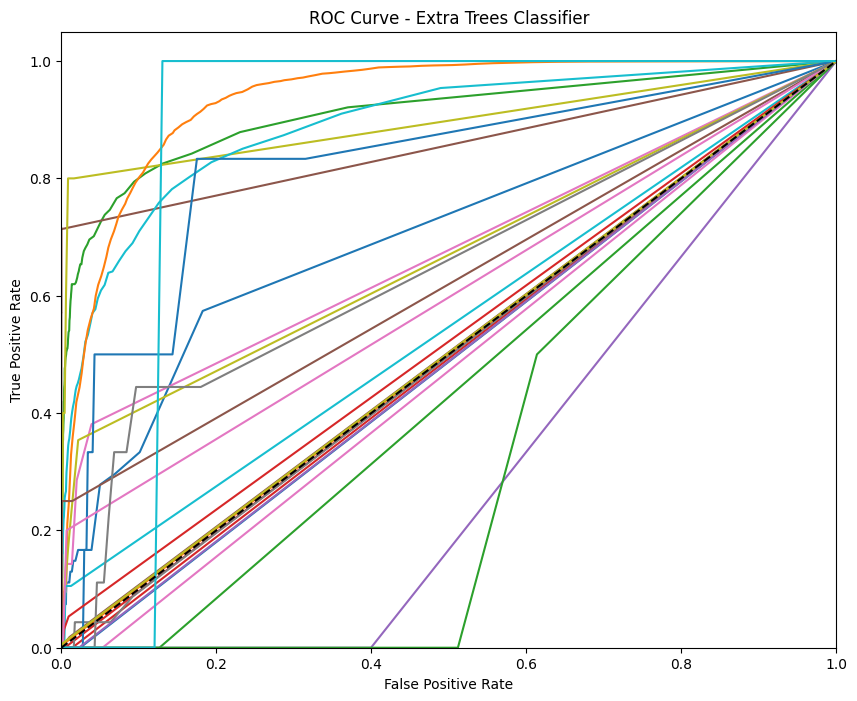

In [17]:
from sklearn.metrics import roc_curve, auc

# Get predicted probabilities for each class
y_pred_proba = et_model.predict_proba(X_test)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(set(y_test))):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_pred_proba[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i in range(len(set(y_test))):
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f) for class %d' % (roc_auc[i], i))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Extra Trees Classifier')
# plt.legend(loc="lower right")
plt.show()


diseaseId                  0
diseaseName                0
diseaseType                0
diseaseClass           11523
diseaseSemanticType        0
NofGenes                   0
NofPmids                   0
dtype: int64
diseaseId              0
diseaseName            0
diseaseType            0
diseaseClass           0
diseaseSemanticType    0
NofGenes               0
NofPmids               0
dtype: int64
   diseaseId  diseaseName  diseaseType  diseaseClass  diseaseSemanticType  \
0          0          531            2           654                   30   
1          1          534            2           284                   30   
2          2          530            2           143                   15   
3          3          546            2           143                   15   
4          4          538            1            49                   23   

   NofGenes  NofPmids  
0         2         2  
1         1         1  
2       103         0  
3         2         0  
4        13  

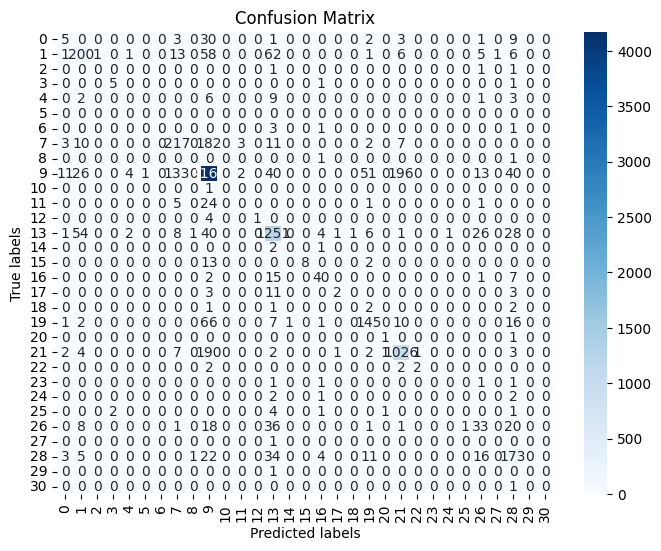

In [7]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from lightgbm import LGBMClassifier
from imblearn.over_sampling import RandomOverSampler
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

path = r"C:\Users\karth\Downloads\disease_associations (1).xls"
data = pd.read_excel(path)

print(data.isnull().sum())

constant_value = 'Unknown'
data['diseaseClass'].fillna(constant_value, inplace=True)

print(data.isnull().sum())

label_encoder = LabelEncoder()
for column in data.select_dtypes(include=['object']).columns:
    data[column] = label_encoder.fit_transform(data[column])

print(data.head())

# data=data.head(1000)

X = data.drop('diseaseSemanticType', axis=1)
y = data['diseaseSemanticType']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=None)

ros = RandomOverSampler(random_state=42)
X_train_resampled, y_train_resampled = ros.fit_resample(X_train, y_train)

lgbm_model = LGBMClassifier(n_estimators=1000, learning_rate=0.1, max_depth=6, num_leaves=31, verbose=0, is_unbalance=True)

lgbm_model.fit(X_train_resampled, y_train_resampled)

y_pred = lgbm_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print('LGBMClassifier:')
print("Accuracy:", accuracy)
# r['LGBM']=accuracy

class_report = classification_report(y_test, y_pred, zero_division=1)
print("\nClassification Report:")
print(class_report)

conf_mat = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()
models['LGBMClassifier']=lgbm_model

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


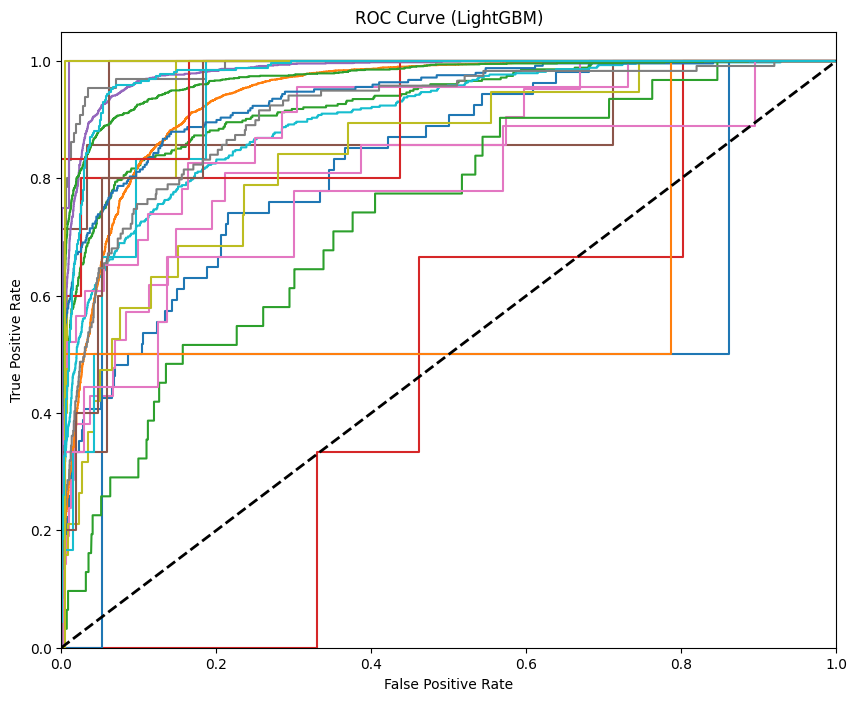

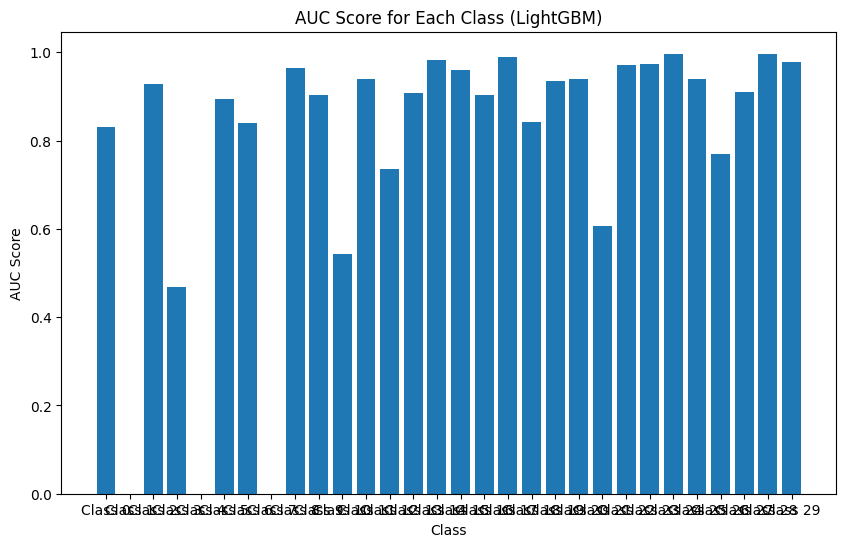

C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.w

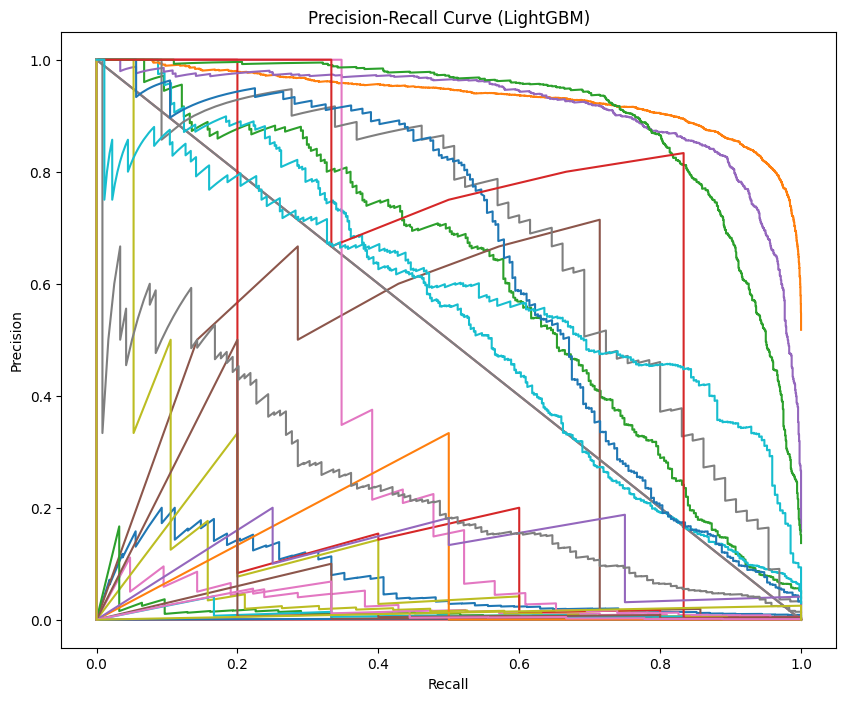

In [15]:
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score

# Get the probability predictions for each class
y_probs_lgbm = lgbm_model.predict_proba(X_test)

# Compute ROC curve and ROC area for each class
fpr_lgbm = dict()
tpr_lgbm = dict()
roc_auc_lgbm = dict()
for i in range(len(lgbm_model.classes_)):
    fpr_lgbm[i], tpr_lgbm[i], _ = roc_curve(y_test == lgbm_model.classes_[i], y_probs_lgbm[:, i])
    roc_auc_lgbm[i] = auc(fpr_lgbm[i], tpr_lgbm[i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i in range(len(lgbm_model.classes_)):
    plt.plot(fpr_lgbm[i], tpr_lgbm[i], label='ROC curve (class {}) (AUC = {:.2f})'.format(i, roc_auc_lgbm[i]))
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (LightGBM)')
# plt.legend(loc="lower right")
plt.show()

# Plot AUC score for each class
plt.figure(figsize=(10, 6))
plt.bar(range(len(roc_auc_lgbm)), list(roc_auc_lgbm.values()), align='center')
plt.xticks(range(len(roc_auc_lgbm)), ['Class {}'.format(i) for i in range(len(roc_auc_lgbm))])
plt.xlabel('Class')
plt.ylabel('AUC Score')
plt.title('AUC Score for Each Class (LightGBM)')
plt.show()

# Compute precision-recall curve and average precision for each class
precision_lgbm = dict()
recall_lgbm = dict()
average_precision_lgbm = dict()
for i in range(len(lgbm_model.classes_)):
    precision_lgbm[i], recall_lgbm[i], _ = precision_recall_curve(y_test == lgbm_model.classes_[i], y_probs_lgbm[:, i])
    average_precision_lgbm[i] = average_precision_score(y_test == lgbm_model.classes_[i], y_probs_lgbm[:, i])

# Plot precision-recall curve for each class
plt.figure(figsize=(10, 8))
for i in range(len(lgbm_model.classes_)):
    plt.plot(recall_lgbm[i], precision_lgbm[i], label='Precision-recall curve (class {}) (AP = {:.2f})'.format(i, average_precision_lgbm[i]))
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve (LightGBM)')
# plt.legend(loc="lower left")
plt.show()


diseaseId                  0
diseaseName                0
diseaseType                0
diseaseClass           11523
diseaseSemanticType        0
NofGenes                   0
NofPmids                   0
dtype: int64
diseaseId              0
diseaseName            0
diseaseType            0
diseaseClass           0
diseaseSemanticType    0
NofGenes               0
NofPmids               0
dtype: int64
   diseaseId  diseaseName  diseaseType  diseaseClass  diseaseSemanticType  \
0          0          531            2           654                   30   
1          1          534            2           284                   30   
2          2          530            2           143                   15   
3          3          546            2           143                   15   
4          4          538            1            49                   23   

   NofGenes  NofPmids  
0         2         2  
1         1         1  
2       103         0  
3         2         0  
4        13  

C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

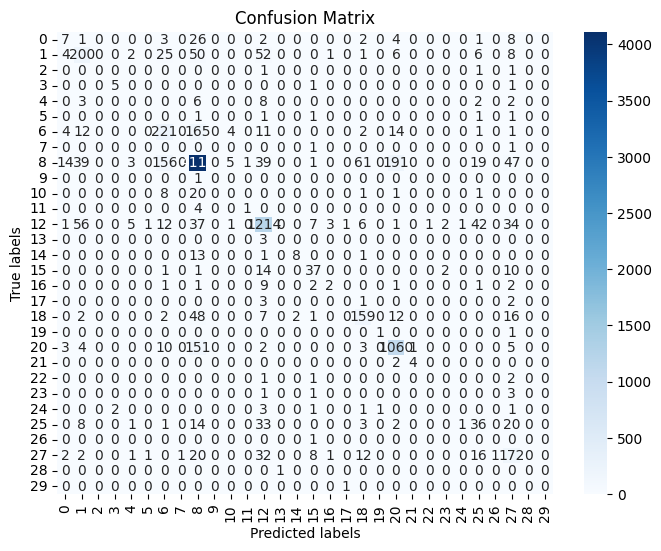

In [8]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import xgboost as xgb
from imblearn.over_sampling import RandomOverSampler
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

path = r"C:\Users\karth\Downloads\disease_associations (1).xls"
data = pd.read_excel(path)

print(data.isnull().sum())

constant_value = 'Unknown'
data['diseaseClass'].fillna(constant_value, inplace=True)
print(data.isnull().sum())

label_encoder = LabelEncoder()
for column in data.select_dtypes(include=['object']).columns:
    data[column] = label_encoder.fit_transform(data[column])
print(data.head())

X = data.drop('diseaseSemanticType', axis=1)
y = data['diseaseSemanticType']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

ros = RandomOverSampler(random_state=42)
X_train_resampled, y_train_resampled = ros.fit_resample(X_train, y_train)
print("Class distribution after over sampling:")
print(pd.Series(y_train_resampled).value_counts())

dtrain = xgb.DMatrix(X_train_resampled, label=y_train_resampled)
dtest = xgb.DMatrix(X_test, label=y_test)

params = {
    'max_depth': 6,
    'eta': 0.1,
    'objective': 'multi:softmax',  # Multi-class classification
    'num_class': len(set(y)),       # Number of classes
    'eval_metric': 'merror'         # Evaluation metric
}

num_rounds = 1000

xgb_model = xgb.train(params, dtrain, num_rounds)

y_pred = xgb_model.predict(dtest)

accuracy = accuracy_score(y_test, y_pred)
print('XGBoost:')
print("Accuracy:", accuracy)
class_report = classification_report(y_test, y_pred)
print("\nClassification Report:")
print(class_report)

conf_mat = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()
models['XGBoost']=xgb_model

In [ ]:
models

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import xgboost as xgb
from imblearn.over_sampling import RandomOverSampler
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

path = r"C:\Users\karth\Downloads\disease_associations (1).xls"
data = pd.read_excel(path)

print(data.isnull().sum())

constant_value = 'Unknown'
data['diseaseClass'].fillna(constant_value, inplace=True)
print(data.isnull().sum())

label_encoder = LabelEncoder()
for column in data.select_dtypes(include=['object']).columns:
    data[column] = label_encoder.fit_transform(data[column])
print(data.head())

X = data.drop('diseaseSemanticType', axis=1)
y = data['diseaseSemanticType']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

ros = RandomOverSampler(random_state=42)
X_train_resampled, y_train_resampled = ros.fit_resample(X_train, y_train)
print("Class distribution after over sampling:")
print(pd.Series(y_train_resampled).value_counts())

dtrain = xgb.DMatrix(X_train_resampled, label=y_train_resampled)
dtest = xgb.DMatrix(X_test, label=y_test)

params = {
    'max_depth': 6,
    'eta': 0.1,
    'objective': 'multi:softmax',  # Multi-class classification
    'num_class': len(set(y)),       # Number of classes
    'eval_metric': 'merror'         # Evaluation metric
}

num_rounds = 1000

# Add the validation dataset for evaluation during training
evals = [(dtrain, 'train'), (dtest, 'eval')]

xgb_model = xgb.train(params, dtrain, num_rounds, evals=evals, early_stopping_rounds=10)

# Extract the evaluation results
eval_results = xgb_model.evals_result()

# Plot the training and validation loss curves
plt.figure(figsize=(10, 6))
plt.plot(eval_results['train']['merror'], label='Training Error')
plt.plot(eval_results['eval']['merror'], label='Validation Error')
plt.xlabel('Number of Iterations')
plt.ylabel('Classification Error')
plt.title('Training and Validation Error Curves')
plt.legend()
plt.show()


diseaseId                  0
diseaseName                0
diseaseType                0
diseaseClass           11523
diseaseSemanticType        0
NofGenes                   0
NofPmids                   0
dtype: int64
diseaseId              0
diseaseName            0
diseaseType            0
diseaseClass           0
diseaseSemanticType    0
NofGenes               0
NofPmids               0
dtype: int64
   diseaseId  diseaseName  diseaseType  diseaseClass  diseaseSemanticType  \
0          0          531            2           654                   30   
1          1          534            2           284                   30   
2          2          530            2           143                   15   
3          3          546            2           143                   15   
4          4          538            1            49                   23   

   NofGenes  NofPmids  
0         2         2  
1         1         1  
2       103         0  
3         2         0  
4        13  

C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

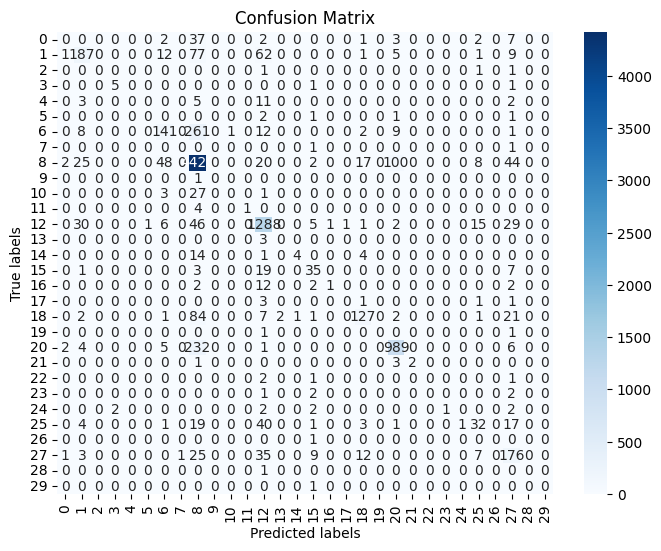

In [9]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import RandomOverSampler
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

path = r"C:\Users\karth\Downloads\disease_associations (1).xls"
data = pd.read_excel(path)

print(data.isnull().sum())

constant_value = 'Unknown'
data['diseaseClass'].fillna(constant_value, inplace=True)

print(data.isnull().sum())

label_encoder = LabelEncoder()
for column in data.select_dtypes(include=['object']).columns:
    data[column] = label_encoder.fit_transform(data[column])

print(data.head())

# data=data.head(1000)

X = data.drop('diseaseSemanticType', axis=1)
y = data['diseaseSemanticType']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

ros = RandomOverSampler(random_state=42)
X_train_resampled, y_train_resampled = ros.fit_resample(X_train, y_train)

print("Class distribution after over sampling:")
print(pd.Series(y_train_resampled).value_counts())

rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

rf_model.fit(X_train, y_train)

y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print('RandomForestClassifier:')
print("Accuracy:", accuracy)
# r['RF']=accuracy

class_report = classification_report(y_test, y_pred)
print("\nClassification Report:")
print(class_report)

conf_mat = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

models['RandomForestClassifier']=rf_model


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


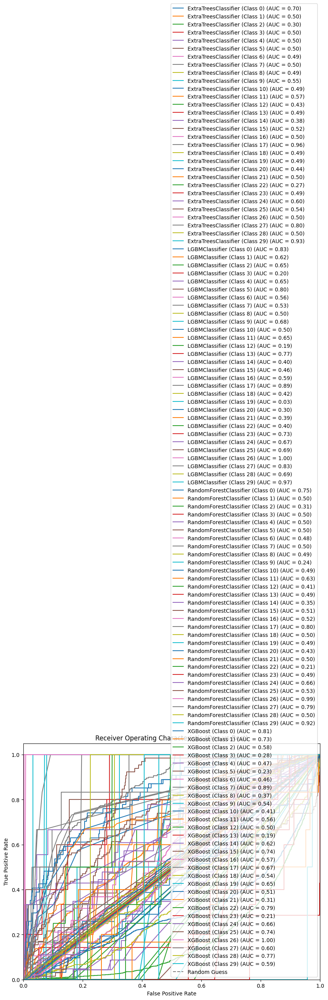

In [11]:
from sklearn.preprocessing import label_binarize

# Binarize the labels
y_test_binarized = label_binarize(y_test, classes=list(set(y_test)))

# Plot ROC curves
plt.figure(figsize=(10, 8))
for name, model in models.items():
    if name == "XGBoost":
        y_scores = model.predict(dtest, output_margin=True)
    else:
        y_scores = model.predict_proba(X_test)
        
    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(set(y_test))):
        fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_scores[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curve for each class
    for i in range(len(set(y_test))):
        plt.plot(fpr[i], tpr[i], label='%s (Class %d) (AUC = %0.2f)' % (name, i, roc_auc[i]))

plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (One-vs-Rest)')
plt.legend(loc="lower right")
plt.show()


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


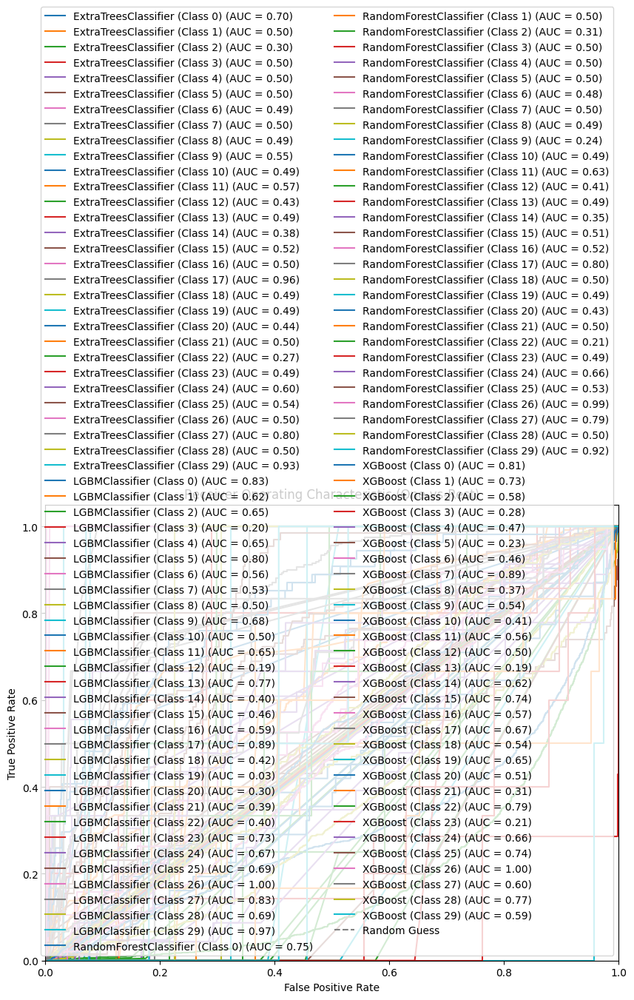

In [12]:
# Plot ROC curves
plt.figure(figsize=(10, 8))
for name, model in models.items():
    if name == "XGBoost":
        y_scores = model.predict(dtest, output_margin=True)
    else:
        y_scores = model.predict_proba(X_test)
        
    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(set(y_test))):
        fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_scores[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curve for each class
    for i in range(len(set(y_test))):
        plt.plot(fpr[i], tpr[i], label='%s (Class %d) (AUC = %0.2f)' % (name, i, roc_auc[i]))

plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (One-vs-Rest)')
# Adjust legend for clarity
plt.legend(loc='lower right', fontsize='medium', ncol=2)
plt.show()


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


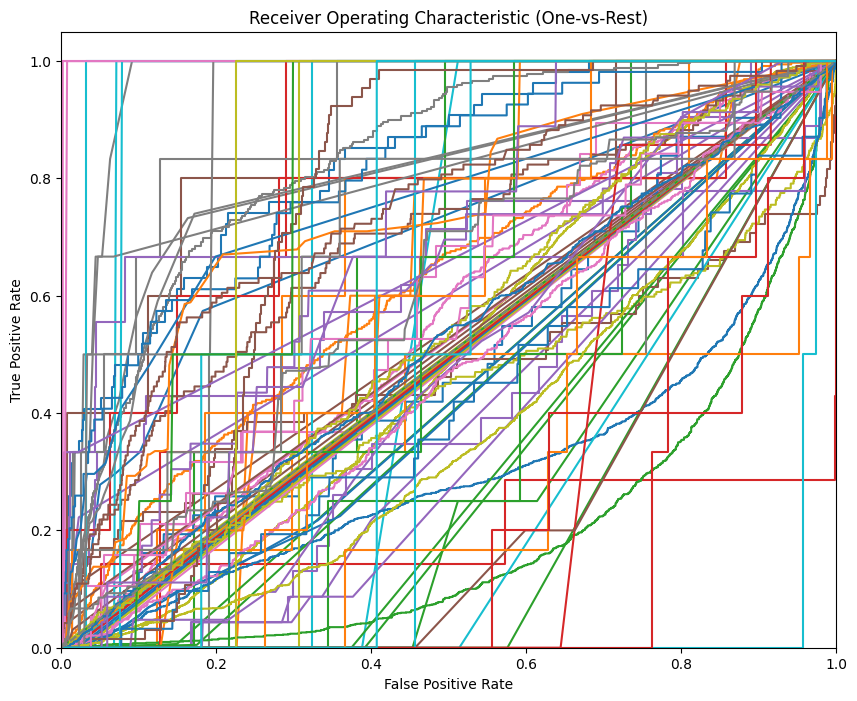

In [21]:
# Plot ROC curves
plt.figure(figsize=(10, 8))
for name, model in models.items():
    if name == "XGBoost":
        y_scores = model.predict(dtest, output_margin=True)
    else:
        y_scores = model.predict_proba(X_test)
        
    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(set(y_test))):
        fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_scores[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curve for each class
    for i in range(len(set(y_test))):
        plt.plot(fpr[i], tpr[i], label='%s (Class %d) (AUC = %0.2f)' % (name, i, roc_auc[i]))

plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (One-vs-Rest)')
# Adjust legend for clarity
# plt.legend(loc='lower right', fontsize='medium', ncol=2)
plt.show()


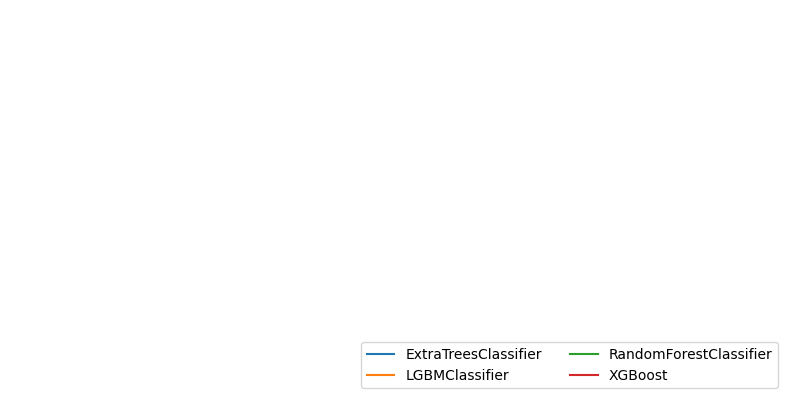

In [16]:
import matplotlib.pyplot as plt

# Create a blank figure
fig, ax = plt.subplots(figsize=(10, 5))

# Add a dummy plot with no data just to generate the legend
for name, _ in models.items():
    ax.plot([], [], label=name)

# Add the legend
ax.legend(loc='lower right', fontsize='medium', ncol=2)

# Hide the axes
ax.axis('off')

# Show the figure with legend only
plt.show()


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


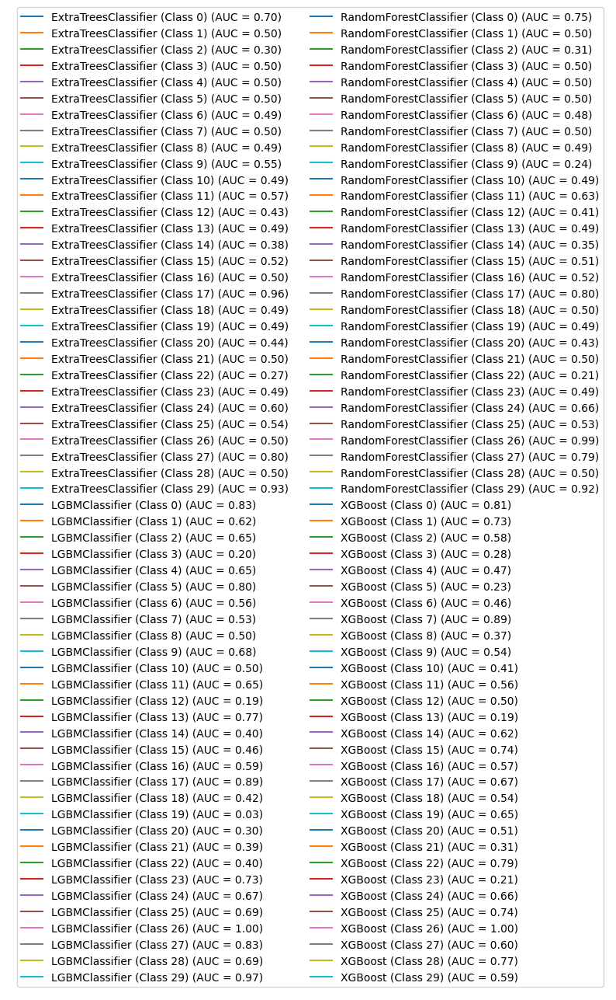

In [17]:
import matplotlib.pyplot as plt

# Create a blank figure
fig, ax = plt.subplots(figsize=(10, 5))

# Add a dummy plot for each class within each model to generate the legend
for name, model in models.items():
    if name == "XGBoost":
        y_scores = model.predict(dtest, output_margin=True)
    else:
        y_scores = model.predict_proba(X_test)
        
    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(set(y_test))):
        fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_scores[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Add a dummy plot for each class
    for i in range(len(set(y_test))):
        ax.plot([], [], label='%s (Class %d) (AUC = %0.2f)' % (name, i, roc_auc[i]))

# Add the legend
ax.legend(loc='lower right', fontsize='medium', ncol=2)

# Hide the axes
ax.axis('off')

# Show the figure with legend only
plt.show()


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


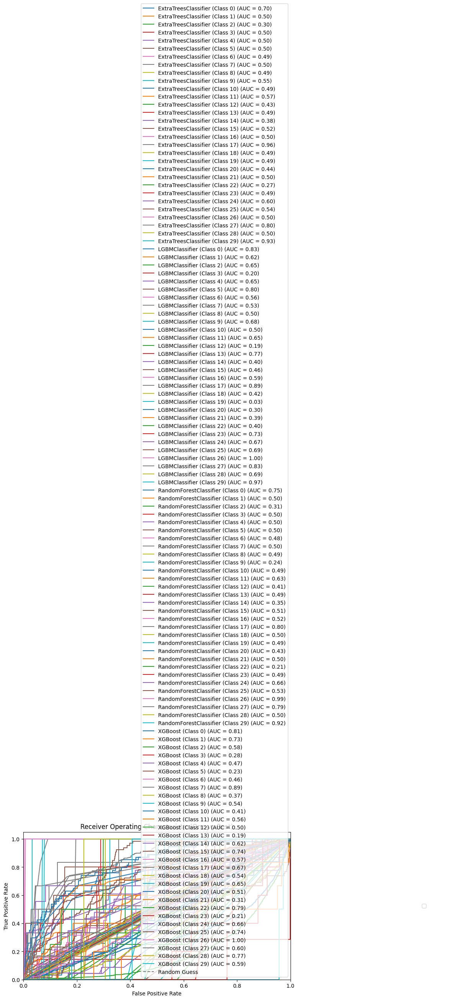

In [20]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Create a blank figure with two halves
fig = plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1])  # Split the figure into two halves

# Plot ROC curves on the left half
ax_graph = plt.subplot(gs[0])
for name, model in models.items():
    if name == "XGBoost":
        y_scores = model.predict(dtest, output_margin=True)
    else:
        y_scores = model.predict_proba(X_test)
        
    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(set(y_test))):
        fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_scores[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plot ROC curve for each class
    for i in range(len(set(y_test))):
        ax_graph.plot(fpr[i], tpr[i], label='%s (Class %d) (AUC = %0.2f)' % (name, i, roc_auc[i]))

ax_graph.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')
ax_graph.set_xlim([0.0, 1.0])
ax_graph.set_ylim([0.0, 1.05])
ax_graph.set_xlabel('False Positive Rate')
ax_graph.set_ylabel('True Positive Rate')
ax_graph.set_title('Receiver Operating Characteristic (One-vs-Rest)')
ax_graph.legend(loc='lower right', fontsize='medium')

# Add the legend on the right half
ax_legend = plt.subplot(gs[1])
ax_legend.axis('off')  # Hide the axes
ax_legend.legend(loc='center', fontsize='medium')

# Adjust the layout to add space between the two halves
plt.subplots_adjust(wspace=0.5)

# Show the figure with the graph and legend
plt.show()


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


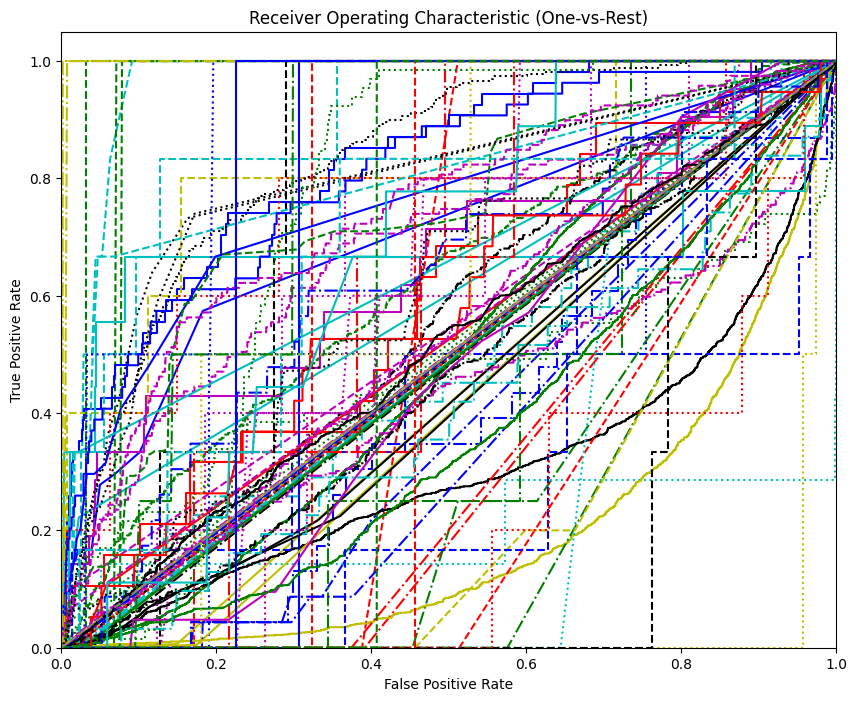

In [14]:
# Plot ROC curves
plt.figure(figsize=(10, 8))
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']
linestyles = ['-', '--', '-.', ':']

for name, model in models.items():
    if name == "XGBoost":
        y_scores = model.predict(dtest, output_margin=True)
    else:
        y_scores = model.predict_proba(X_test)
        
    # Compute ROC curve and ROC area for each class
    for i in range(len(set(y_test))):
        fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_scores[:, i])
        roc_auc = auc(fpr[i], tpr[i])

        # Plot ROC curve for each class with different color and linestyle
        plt.plot(fpr[i], tpr[i], color=colors[i % len(colors)], linestyle=linestyles[i % len(linestyles)],
                 label='%s (Class %d) (AUC = %0.2f)' % (name, i, roc_auc))

plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (One-vs-Rest)')
# Adjust legend for clarity
# plt.legend(loc='lower right', fontsize='medium', ncol=2)
plt.show()


In [8]:
# Fit the RandomForestClassifier with the training data
rf_model.fit(X_train_resampled, y_train_resampled)

# Check if the RandomForestClassifier is fitted properly
if not hasattr(rf_model, 'estimators_') or len(rf_model.estimators_) == 0:
    print("RandomForestClassifier is not fitted with any trees.")
else:
    print("RandomForestClassifier is fitted with {} trees.".format(len(rf_model.estimators_)))

# Now, proceed to predict probabilities
y_probs_rf = rf_model.predict_proba(X_test)


RandomForestClassifier is fitted with 80 trees.


C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


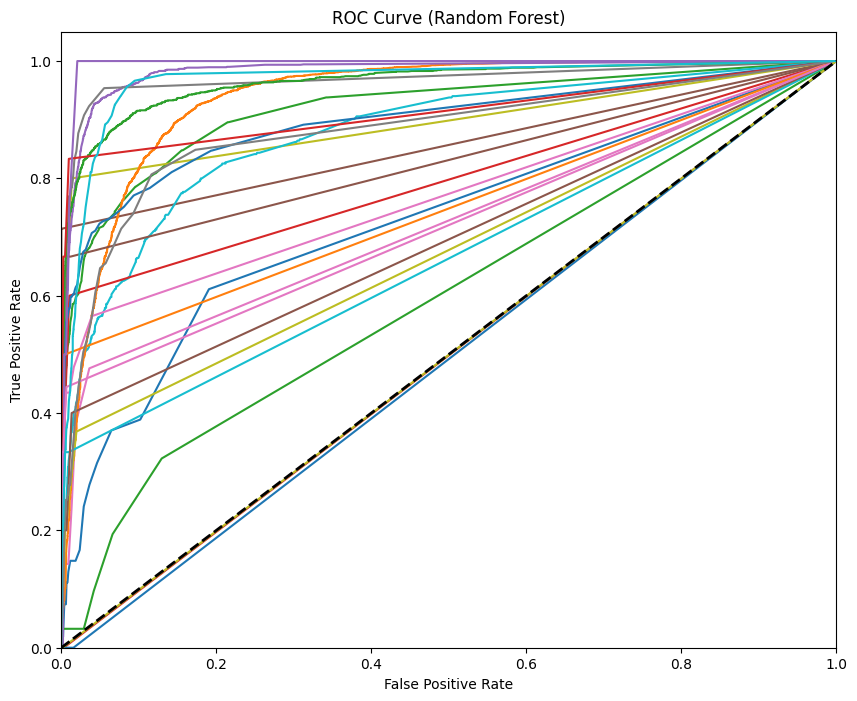

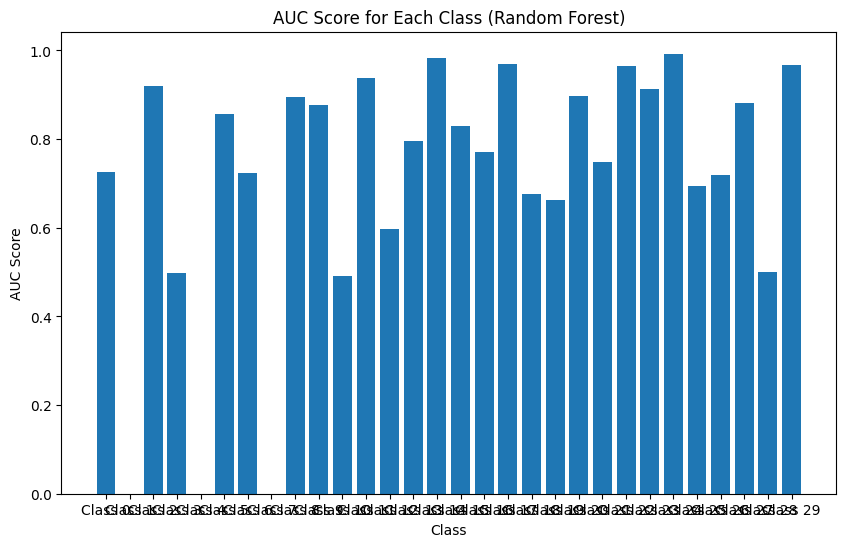

C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.w

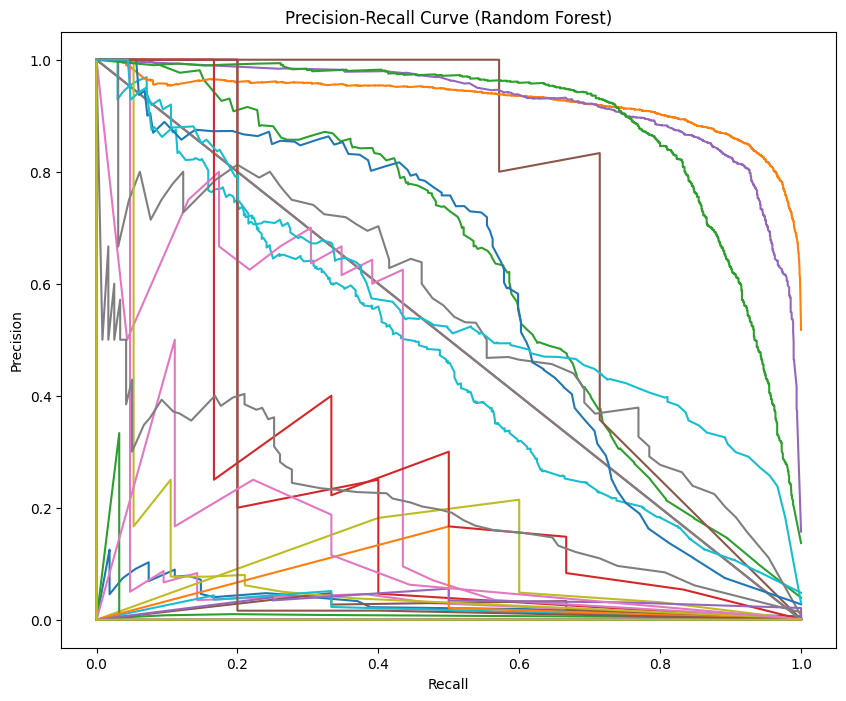

In [11]:
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score

# Get the probability predictions for each class
y_probs_rf = rf_model.predict_proba(X_test)

# Compute ROC curve and ROC area for each class
fpr_rf = dict()
tpr_rf = dict()
roc_auc_rf = dict()
for i in range(len(rf_model.classes_)):
    fpr_rf[i], tpr_rf[i], _ = roc_curve(y_test == rf_model.classes_[i], y_probs_rf[:, i])
    roc_auc_rf[i] = auc(fpr_rf[i], tpr_rf[i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i in range(len(rf_model.classes_)):
    plt.plot(fpr_rf[i], tpr_rf[i], label='ROC curve (class {}) (AUC = {:.2f})'.format(i, roc_auc_rf[i]))
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Random Forest)')
# plt.legend(loc="lower right")
plt.show()

# Plot AUC score for each class
plt.figure(figsize=(10, 6))
plt.bar(range(len(roc_auc_rf)), list(roc_auc_rf.values()), align='center')
plt.xticks(range(len(roc_auc_rf)), ['Class {}'.format(i) for i in range(len(roc_auc_rf))])
plt.xlabel('Class')
plt.ylabel('AUC Score')
plt.title('AUC Score for Each Class (Random Forest)')
plt.show()

# Compute precision-recall curve and average precision for each class
precision_rf = dict()
recall_rf = dict()
average_precision_rf = dict()
for i in range(len(rf_model.classes_)):
    precision_rf[i], recall_rf[i], _ = precision_recall_curve(y_test == rf_model.classes_[i], y_probs_rf[:, i])
    average_precision_rf[i] = average_precision_score(y_test == rf_model.classes_[i], y_probs_rf[:, i])

# Plot precision-recall curve for each class
plt.figure(figsize=(10, 8))
for i in range(len(rf_model.classes_)):
    plt.plot(recall_rf[i], precision_rf[i], label='Precision-recall curve (class {}) (AP = {:.2f})'.format(i, average_precision_rf[i]))
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve (Random Forest)')
# plt.legend(loc="lower left")
plt.show()


In [8]:
print(r)

{'CBC': 0.7293116782675947, 'ET': 0.802342282620705, 'LGBM': 0.8041100430891615, 'RF': 0.8184730968953706}


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from imblearn.over_sampling import RandomOverSampler
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import VotingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier
from sklearn.linear_model import RidgeClassifier

path = r"C:\Users\karth\Downloads\disease_associations (1).xls"
data = pd.read_excel(path)

print(data.isnull().sum())

constant_value = 'Unknown'
data['diseaseClass'].fillna(constant_value, inplace=True)

print(data.isnull().sum())

label_encoder = LabelEncoder()
for column in data.select_dtypes(include=['object']).columns:
    data[column] = label_encoder.fit_transform(data[column])

print(data.head())

# data=data.head(1000)

X = data.drop('diseaseSemanticType', axis=1)
y = data['diseaseSemanticType']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

ros = RandomOverSampler(random_state=42)
X_train_resampled, y_train_resampled = ros.fit_resample(X_train, y_train)

print("Class distribution after over sampling:")
print(pd.Series(y_train_resampled).value_counts())



et_model = ExtraTreesClassifier(n_estimators=100, random_state=42)
lgbm_model = LGBMClassifier(n_estimators=1000, learning_rate=0.1, max_depth=6, num_leaves=31, verbose=0, is_unbalance=True)
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
catboost_model = CatBoostClassifier(iterations=1000, learning_rate=0.2, depth=6, verbose=0)
dtrain = xgb.DMatrix(X_train_resampled, label=y_train_resampled)
dtest = xgb.DMatrix(X_test, label=y_test)
params = {
    'max_depth': 6,
    'eta': 0.1,
    'objective': 'multi:softmax',  # Multi-class classification
    'num_class': len(set(y)),       # Number of classes
    'eval_metric': 'merror'         # Evaluation metric
}

num_rounds = 1000

xgb_model = xgb.train(params, dtrain, num_rounds)
ensemble_clf = VotingClassifier(
    estimators=[
        ('CatBoost', catboost_model),
        ('LGBM', lgbm_model),
        ('Extra Trees', et_model),
        ('Random Forest', rf_model),
        ('XGBoost', xgb_model)
    ],
    voting='hard'
)

ensemble_clf.fit(X_train_resampled, y_train_resampled)
ensemble_pred = ensemble_clf.predict(X_test).ravel()  

print()
ensemble_accuracy = accuracy_score(y_test, ensemble_pred)
print("Ensemble Classifier Accuracy:", ensemble_accuracy)
r['EVC']=ensemble_accuracy
ensemble_class_report = classification_report(y_test, ensemble_pred)
print("Ensemble Classifier Classification Report:")
print(ensemble_class_report)

conf_mat = confusion_matrix(y_test, ensemble_pred)
fig, ax = plt.subplots(figsize=(8, 6))

sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', ax=ax, annot_kws={"fontsize":30})
ax.set_xlabel('Predicted labels', fontsize=25)
ax.set_ylabel('True labels', fontsize=25)
ax.set_title('confusion_mat_Voting_ensemble', fontsize=25)

plt.tight_layout()
plt.show()


diseaseId                  0
diseaseName                0
diseaseType                0
diseaseClass           11523
diseaseSemanticType        0
NofGenes                   0
NofPmids                   0
dtype: int64
diseaseId              0
diseaseName            0
diseaseType            0
diseaseClass           0
diseaseSemanticType    0
NofGenes               0
NofPmids               0
dtype: int64
   diseaseId  diseaseName  diseaseType  diseaseClass  diseaseSemanticType  \
0          0          531            2           654                   30   
1          1          534            2           284                   30   
2          2          530            2           143                   15   
3          3          546            2           143                   15   
4          4          538            1            49                   23   

   NofGenes  NofPmids  
0         2         2  
1         1         1  
2       103         0  
3         2         0  
4        13  

diseaseId                  0
diseaseName                0
diseaseType                0
diseaseClass           11523
diseaseSemanticType        0
NofGenes                   0
NofPmids                   0
dtype: int64
diseaseId              0
diseaseName            0
diseaseType            0
diseaseClass           0
diseaseSemanticType    0
NofGenes               0
NofPmids               0
dtype: int64
   diseaseId  diseaseName  diseaseType  diseaseClass  diseaseSemanticType  \
0          0          531            2           654                   30   
1          1          534            2           284                   30   
2          2          530            2           143                   15   
3          3          546            2           143                   15   
4          4          538            1            49                   23   

   NofGenes  NofPmids  
0         2         2  
1         1         1  
2       103         0  
3         2         0  
4        13  

C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

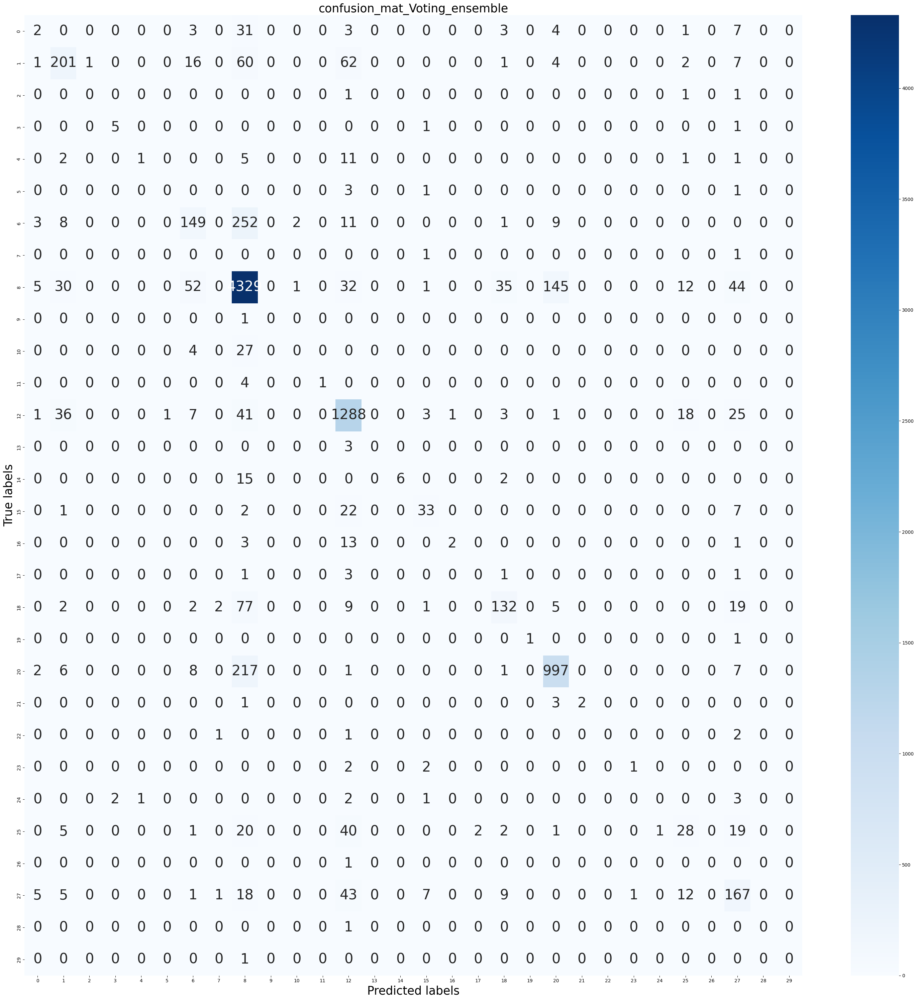

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from imblearn.over_sampling import RandomOverSampler
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import VotingClassifier
from xgboost import XGBClassifier
# from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier

path = r"C:\Users\karth\Downloads\disease_associations (1).xls"
data = pd.read_excel(path)

print(data.isnull().sum())

constant_value = 'Unknown'
data['diseaseClass'].fillna(constant_value, inplace=True)

print(data.isnull().sum())

label_encoder = LabelEncoder()
for column in data.select_dtypes(include=['object']).columns:
    data[column] = label_encoder.fit_transform(data[column])

print(data.head())

# data=data.head(1000)

X = data.drop('diseaseSemanticType', axis=1)
y = data['diseaseSemanticType']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

ros = RandomOverSampler(random_state=42)
X_train_resampled, y_train_resampled = ros.fit_resample(X_train, y_train)

print("Class distribution after over sampling:")
print(pd.Series(y_train_resampled).value_counts())

et_model = ExtraTreesClassifier(n_estimators=100, random_state=42)
lgbm_model = LGBMClassifier(n_estimators=1000, learning_rate=0.1, max_depth=6, num_leaves=31, verbose=0, is_unbalance=True)
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
# catboost_model = CatBoostClassifier(iterations=1000, learning_rate=0.2, depth=6, verbose=0)
# xgb_model = XGBClassifier(max_depth=6, learning_rate=0.1, objective='multi:softmax', num_class=len(set(y)), n_estimators=1000)

ensemble_clf = VotingClassifier(
    estimators=[
#         ('CatBoost', catboost_model),
        ('LGBM', lgbm_model),
        ('Extra Trees', et_model),
        ('Random Forest', rf_model),
        # ('XGBoost', xgb_model)
    ],
    voting='hard'
)

ensemble_clf.fit(X_train_resampled, y_train_resampled)
ensemble_pred = ensemble_clf.predict(X_test).ravel()

print()
ensemble_accuracy = accuracy_score(y_test, ensemble_pred)
print("Ensemble Classifier Accuracy:", ensemble_accuracy)
ensemble_class_report = classification_report(y_test, ensemble_pred)
print("Ensemble Classifier Classification Report:")
print(ensemble_class_report)

conf_mat = confusion_matrix(y_test, ensemble_pred)
fig, ax = plt.subplots(figsize=(30, 30))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', ax=ax, annot_kws={"fontsize":30})
ax.set_xlabel('Predicted labels', fontsize=25)
ax.set_ylabel('True labels', fontsize=25)
ax.set_title('confusion_mat_Voting_ensemble', fontsize=25)

plt.tight_layout()
plt.show()


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


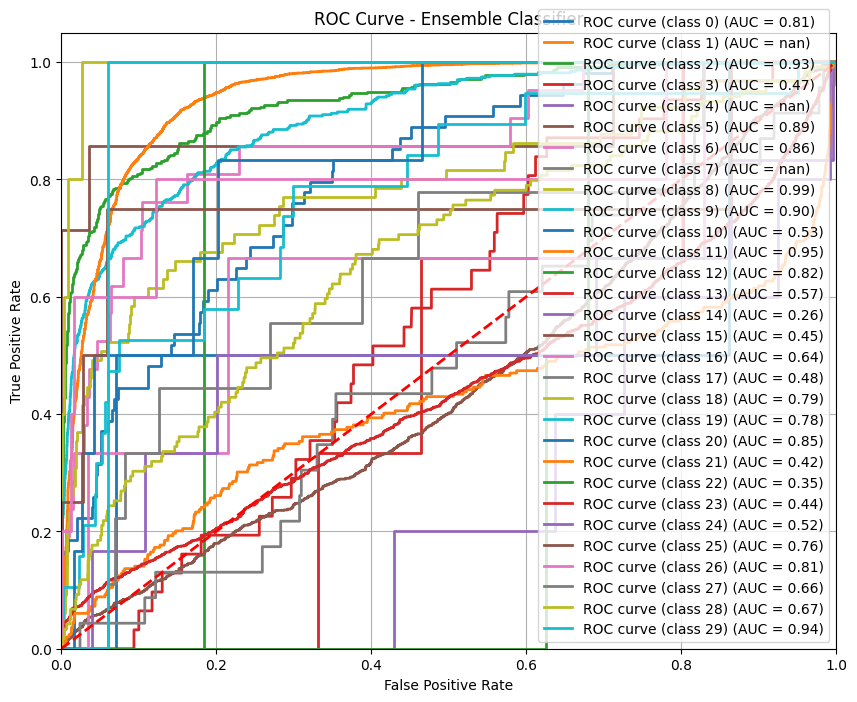

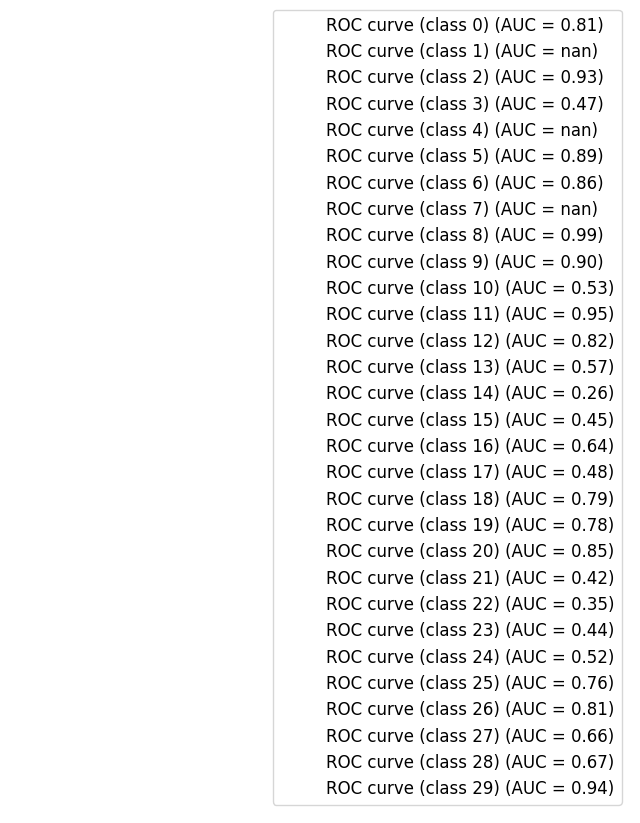

In [4]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Change voting to 'soft' to enable predict_proba
ensemble_clf = VotingClassifier(
    estimators=[
#         ('CatBoost', catboost_model),
        ('LGBM', lgbm_model),
        ('Extra Trees', et_model),
        ('Random Forest', rf_model),
        # ('XGBoost', xgb_model)
    ],
    voting='soft'  # Change to soft voting
)

ensemble_clf.fit(X_train_resampled, y_train_resampled)

# Get predicted probabilities for each class
if hasattr(ensemble_clf, "predict_proba"):
    y_pred_proba = ensemble_clf.predict_proba(X_test)
else:
    raise AttributeError("predict_proba is not available")

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(set(y_test))):
    fpr[i], tpr[i], _ = roc_curve(y_test == i, y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i in range(len(set(y_test))):
    plt.plot(fpr[i], tpr[i], lw=2, label='ROC curve (class {}) (AUC = {:.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Ensemble Classifier')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# Display only legend separately
plt.figure(figsize=(8, 6))  # Adjust figsize if needed
for i in range(len(set(y_test))):
    plt.plot([], [], ' ', label='ROC curve (class {}) (AUC = {:.2f})'.format(i, roc_auc[i]))

plt.legend(loc='lower right', fontsize=12)
ax.legend(loc='lower right', fontsize='medium', ncol=2)
plt.gca().set_axis_off()  # Turn off axis
plt.show()


C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


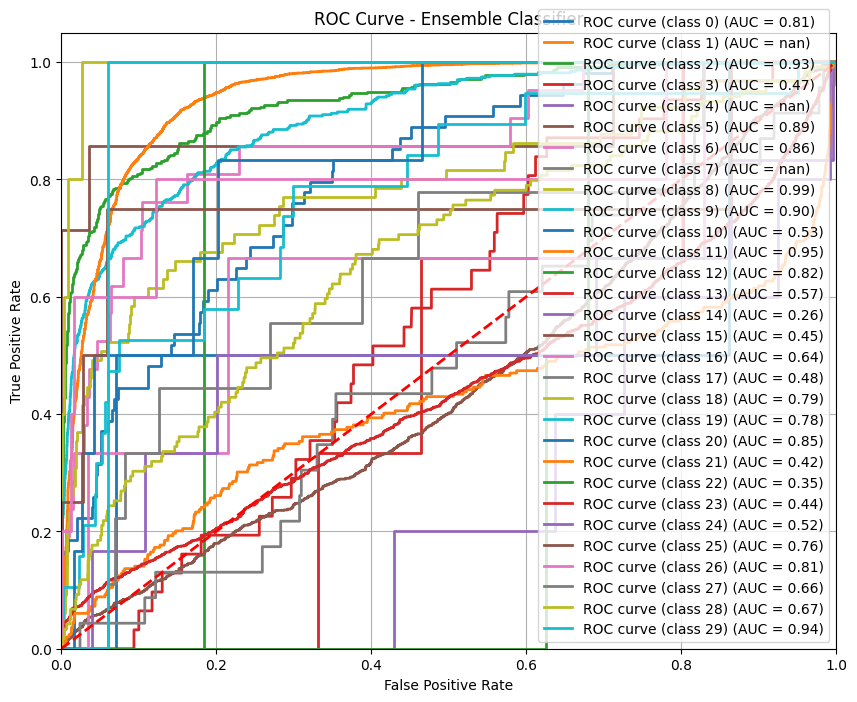

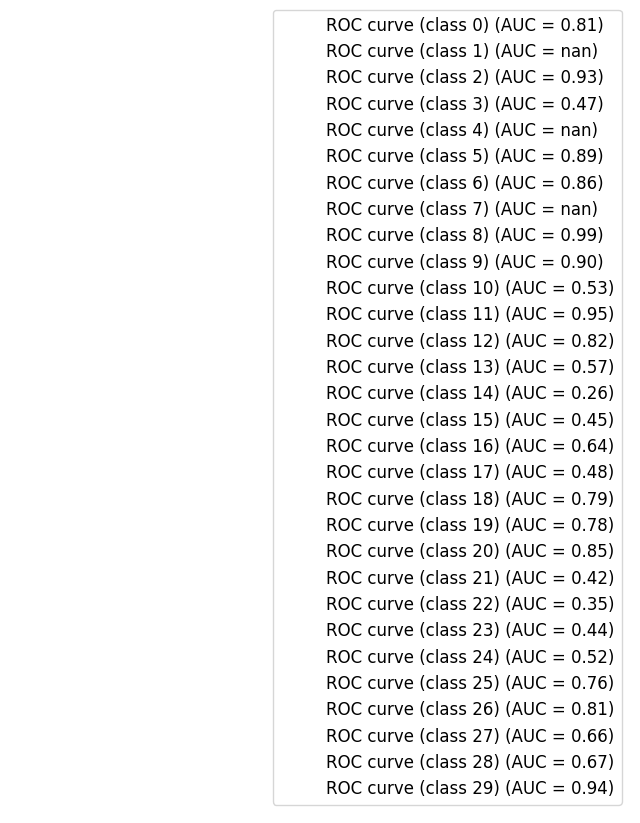

In [8]:
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(set(y_test))):
    fpr[i], tpr[i], _ = roc_curve(y_test == i, y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i in range(len(set(y_test))):
    plt.plot(fpr[i], tpr[i], lw=2, label='ROC curve (class {}) (AUC = {:.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Ensemble Classifier')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# Display only legend separately
plt.figure(figsize=(8, 6))  # Adjust figsize if needed
for i in range(len(set(y_test))):
    plt.plot([], [], ' ', label='ROC curve (class {}) (AUC = {:.2f})'.format(i, roc_auc[i]))

plt.legend(loc='lower right', fontsize=12)
# ax.legend(loc='lower right', fontsize='medium', ncol=2)
plt.gca().set_axis_off()  # Turn off axis
plt.show()

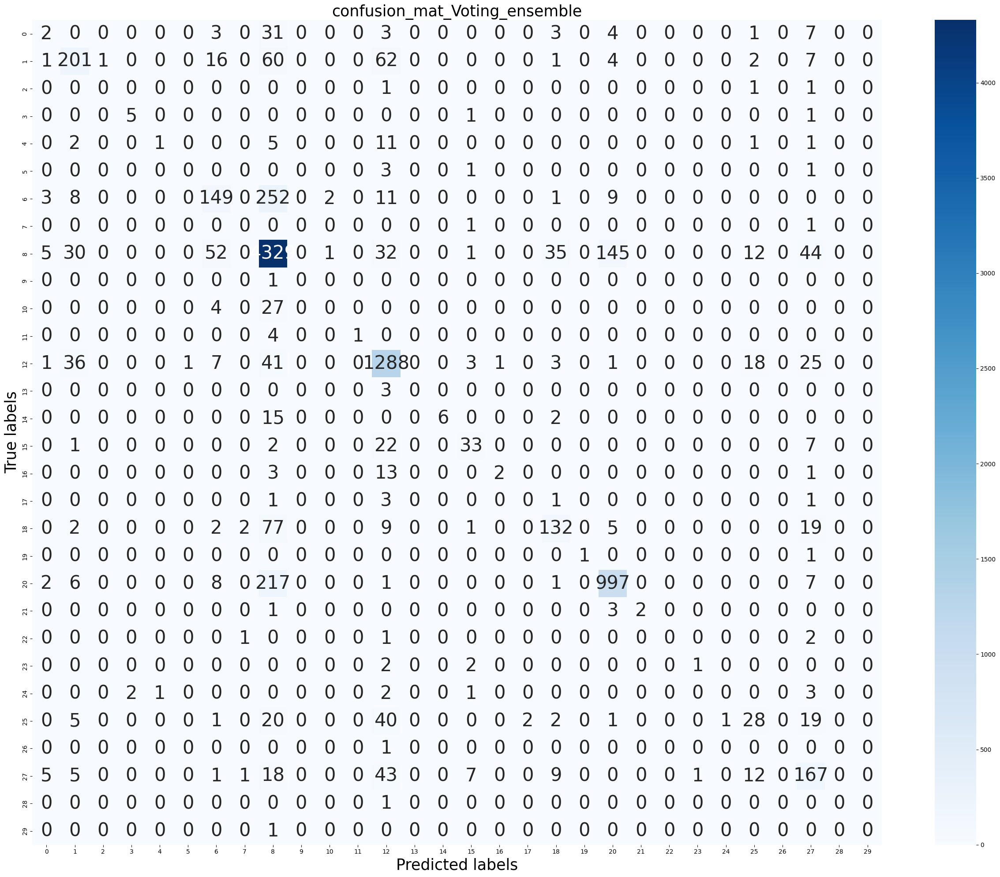

In [5]:
conf_mat = confusion_matrix(y_test, ensemble_pred)
fig, ax = plt.subplots(figsize=(25, 20))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', ax=ax, annot_kws={"fontsize":30})
ax.set_xlabel('Predicted labels', fontsize=25)
ax.set_ylabel('True labels', fontsize=25)
ax.set_title('confusion_mat_Voting_ensemble', fontsize=25)

plt.tight_layout()
plt.show()

In [8]:
ensemble_clf = VotingClassifier(
    estimators=[
        ('LGBM', lgbm_model),
        ('Extra Trees', et_model),
        ('Random Forest', rf_model),
    ],
    voting='soft'  # Use soft voting to enable predict_proba
)

ensemble_clf.fit(X_train_resampled, y_train_resampled)
y_pred_proba = ensemble_clf.predict_proba(X_test)


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
Accuracy: 0.8172577615733068
Classification Report:
              precision    recall  f1-score   support

           0       0.13      0.04      0.06        54
           2       0.69      0.56      0.62       355
           3       0.00      0.00      0.00         3
           5       0.71      0.71      0.71         7
           6       0.50      0.05      0.09        21
           8       0.00      0.00      0.00         5
           9       0.64      0.44      0.52       435
          10       0.00      0.00      0.00         2
          11       0.86      0.92      0.89      4686
          12       0.00      0.00      0.00         1
          13       0.00      0.00      0.00        31
          14       1.00      0.20      

C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1497: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

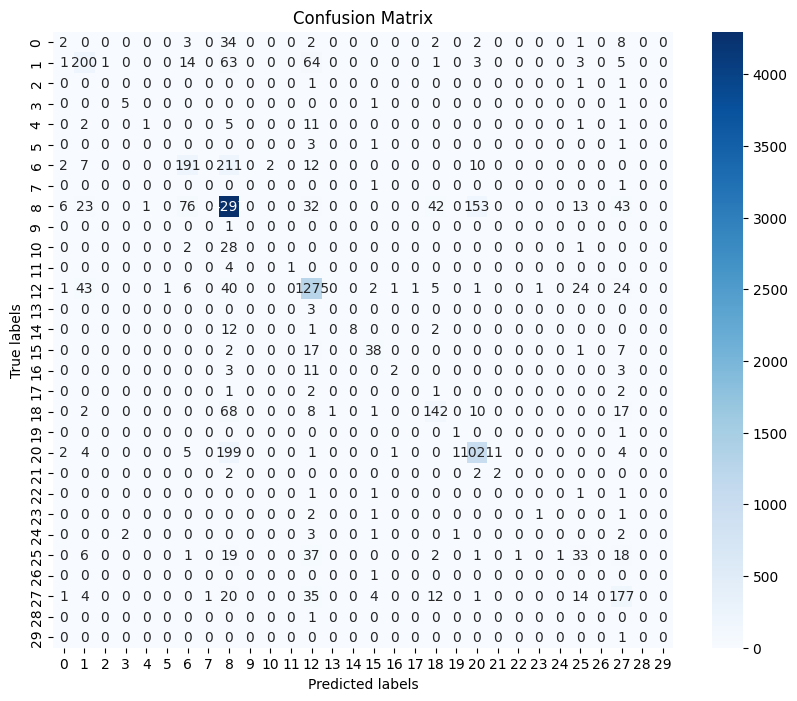

In [9]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Predict probabilities
y_pred_proba = ensemble_clf.predict_proba(X_test)

# Predict class labels
y_pred = ensemble_clf.predict(X_test)

# Compute accuracy
accuracy = accuracy_score(y_test, y_pred)
print('Accuracy:', accuracy)

# Classification report
class_report = classification_report(y_test, y_pred)
print('Classification Report:')
print(class_report)

# Confusion matrix
conf_mat = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:')

import seaborn as sns
import matplotlib.pyplot as plt

# Plot confusion matrix using seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
C:\Users\karth\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


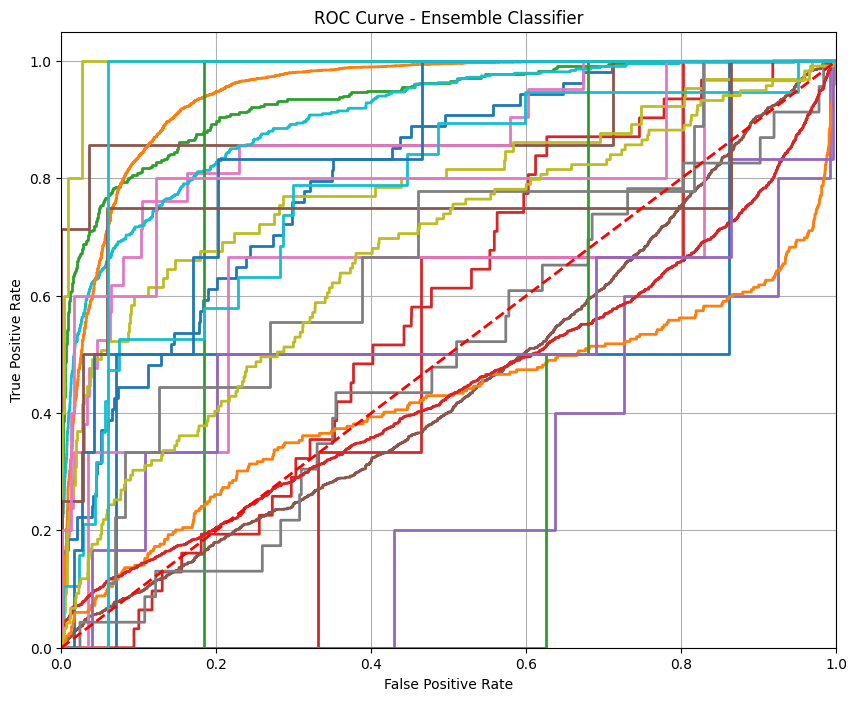

In [11]:
from sklearn.metrics import roc_curve, auc

# Get predicted probabilities for each class
y_pred_proba = ensemble_clf.predict_proba(X_test)

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(set(y_test))):
    fpr[i], tpr[i], _ = roc_curve(y_test, y_pred_proba[:, i], pos_label=i)
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i in range(len(set(y_test))):
    plt.plot(fpr[i], tpr[i], lw=2, label='ROC curve (class {0}) (AUC = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Ensemble Classifier')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()


In [ ]:
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i in range(len(set(y_test))):
    plt.plot(fpr[i], tpr[i], lw=2, label='ROC curve (class {0}) (AUC = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Ensemble Classifier')
plt.grid(True)
plt.legend(loc='lower right')
plt.show()

# Display only legend separately
plt.figure(figsize=(6, 4))  # Adjust figsize as needed
for i in range(len(set(y_test))):
    plt.plot([], [], ' ', label='ROC curve (class {}) (AUC = {:.2f})'.format(i, roc_auc[i]))

plt.legend(loc='lower right')
plt.gca().set_axis_off()  # Turn off axis
plt.show()


In [18]:
print(r)

{'CBC': 0.7293116782675947, 'ET': 0.802342282620705}


diseaseId                  0
diseaseName                0
diseaseType                0
diseaseClass           11523
diseaseSemanticType        0
NofGenes                   0
NofPmids                   0
dtype: int64
diseaseId              0
diseaseName            0
diseaseType            0
diseaseClass           0
diseaseSemanticType    0
NofGenes               0
NofPmids               0
dtype: int64


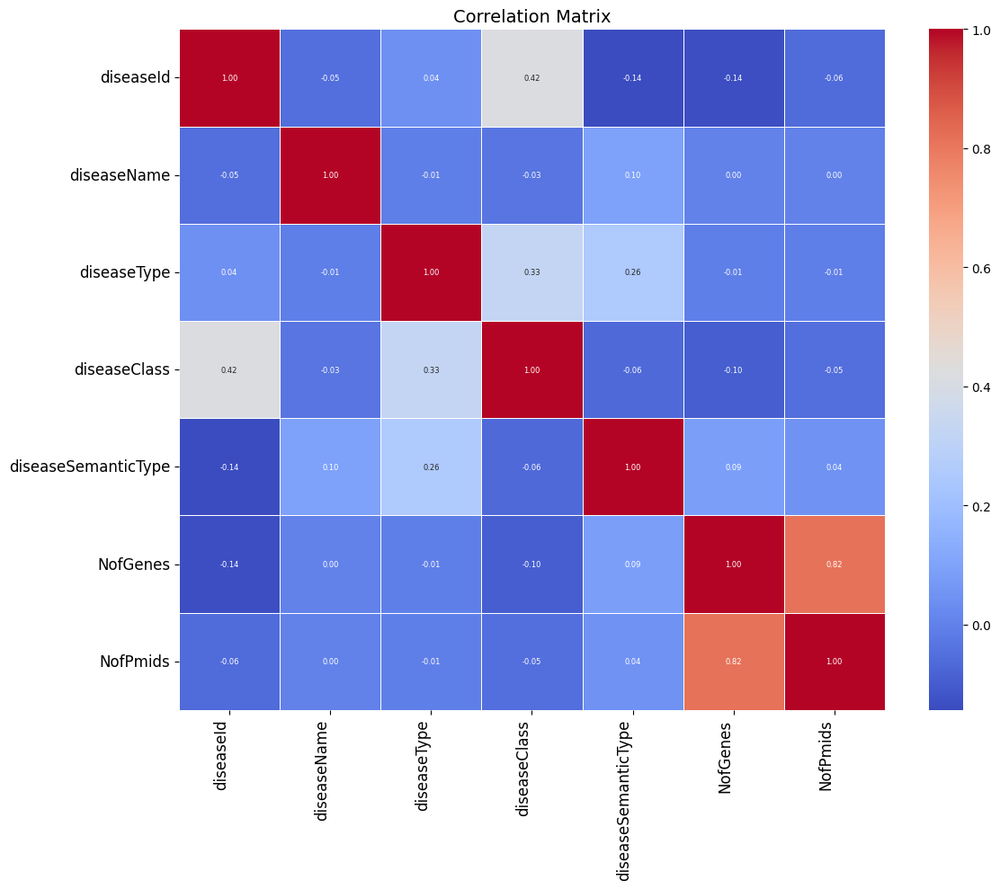

In [20]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

path = r"C:\Users\karth\Downloads\disease_associations (1).xls"
data = pd.read_excel(path)

print(data.isnull().sum())

constant_value = 'Unknown'
data['diseaseClass'].fillna(constant_value, inplace=True)

print(data.isnull().sum())

label_encoder = LabelEncoder()
for column in data.select_dtypes(include=['object']).columns:
    data[column] = label_encoder.fit_transform(data[column])


correlations = data.corr()

# Plotting the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlations, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5, annot_kws={"size": 6})
plt.xticks(ha='right', fontsize=12)
plt.yticks(rotation=0, fontsize=12)
plt.title('Correlation Matrix', fontsize=14)
plt.tight_layout()
plt.show()

# # Plotting the correlation matrix
# plt.figure(figsize=(12, 10))
# sns.heatmap(correlations, annot=True, cmap='coolwarm', fmt=".2f")
# plt.title('Correlation Matrix')
# plt.show()